torch.Size([1, 3, 400, 600])
torch.Size([3, 400, 600])


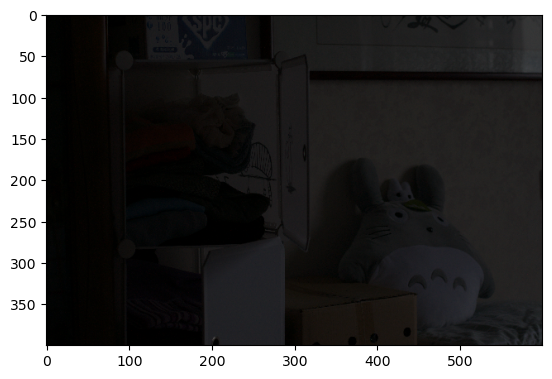

In [1]:
from PIL import Image
import matplotlib.pyplot as plt
img = Image.open('./low/22.png')
img2 = Image.open('./high/179.png')
gt = Image.open('./high/22.png')
import torchvision.transforms as transforms
transform = transforms.ToTensor()
x = transform(img)
gt = transform(gt)
img2 = transform(img2)
x = x.unsqueeze(0)
x_input = x
print(x.shape)
print(gt.shape)
plt.imshow(x[0].permute(1,2,0).numpy())

In [54]:
x_numpy = x[0].permute(1,2,0).numpy()
x_gray = x_numpy[:, :, 2]*0.3 + x_numpy[:, :, 1]*0.59 + x_numpy[:, :, 0] * 0.11

In [56]:
x_gray

array([[0.00815686, 0.00858824, 0.00505882, ..., 0.19219609, 0.19564705,
        0.20698039],
       [0.00462745, 0.0034902 , 0.00580392, ..., 0.2       , 0.20635293,
        0.19564705],
       [0.00898039, 0.00823529, 0.00698039, ..., 0.20960784, 0.2014902 ,
        0.2030196 ],
       ...,
       [0.00811765, 0.00639216, 0.00392157, ..., 0.18454902, 0.13976471,
        0.11317647],
       [0.00694118, 0.        , 0.0034902 , ..., 0.17403923, 0.12737255,
        0.08976471],
       [0.01176471, 0.00827451, 0.00823529, ..., 0.1494902 , 0.11533333,
        0.07768628]], dtype=float32)

In [2]:
import pywt
import torch
def dwt_init(x): 
    x01 = x[:, :, 0::2, :] / 2
    x02 = x[:, :, 1::2, :] / 2
    x1 = x01[:, :, :, 0::2]
    x2 = x02[:, :, :, 0::2]
    x3 = x01[:, :, :, 1::2]
    x4 = x02[:, :, :, 1::2]
    x_LL = (x1 + x2 + x3 + x4)
    
    x_HL = -x1 - x2 + x3 + x4
    x_LH = -x1 + x2 - x3 + x4
    x_HH = x1 - x2 - x3 + x4
    # print(x_HH[:, 0, :, :])
#     return torch.cat((x_LL, x_HL, x_LH, x_HH), 1)
    return x_LL, x_HL, x_LH, x_HH
dwt_res = dwt_init(x)

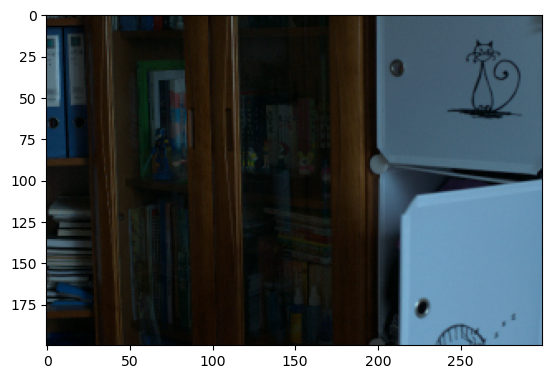

In [3]:
# dwt_res = dwt_init(dwt_res[0])
plt.imshow(dwt_res[0][0].permute(1,2,0).numpy())


In [3]:
def dwt(x):
    x01 = x[:, :, 0::2, :] / 2
    x02 = x[:, :, 1::2, :] / 2
    x1 = x01[:, :, :, 0::2]
    x2 = x02[:, :, :, 0::2]
    x3 = x01[:, :, :, 1::2]
    x4 = x02[:, :, :, 1::2]
    return x1, x2, x3, x4

In [4]:
x2 = transform(img2).unsqueeze(0)
low_x2, high_x2 = dwt(x2)
low_x1, high_x1 = dwt(gt.unsqueeze(0))

x2_mix = iwt((low_x2, high_x1))
plt.imshow(x2_mix[0].permute(1,2,0).numpy())

TypeError: pic should be PIL Image or ndarray. Got <class 'torch.Tensor'>

# 上采样+DWT
上采样之后再用DWT可获得跟输入同样大小的enhance图像。

这里用的是pytorch_wavelets 的DWT

In [39]:
from pytorch_wavelets import DWT1DForward, DWT1DInverse, DWTForward, DWTInverse, DTCWTForward, DTCWTInverse
import torch.nn as nn
dwt = DWTForward(J=1, mode = 'zero', wave='haar')
# dwt = pywt.dwt2(x, 'haar', 'zero')
iwt = DWTInverse(mode='zero')
# dwt1, dwt2 = dwt(x)

# plt.imshow(dwt[0][0])

In [ ]:
dwt11, dwt22 = dwt(dwt1)


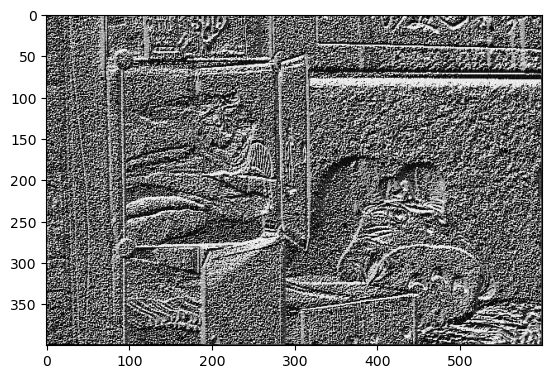

In [40]:

import cv2
import numpy as np
def bili_resize(factor):
    return nn.Upsample(scale_factor=factor, mode='bilinear', align_corners=True)
upsample = bili_resize(2)
# x_big = upsample(upsample(upsample(upsample(x))))
# x_big = upsample(upsample(upsample(x)))
# x_big = upsample(x)
# x_big = upsample(upsample(x))
x_big = upsample(x)
dwt1, dwt2 = dwt(x_big)
test = torch.sin(dwt1[0]).permute(1,2,0).numpy()
test = (test*255).astype(np.uint8)
test_gray = cv2.cvtColor(test, cv2.COLOR_RGB2GRAY)

# Image.fromarray(test).save('wave0.png')
plt.imshow(LBP(test_gray), cmap='gray')

torch.Size([3, 3200, 4800])


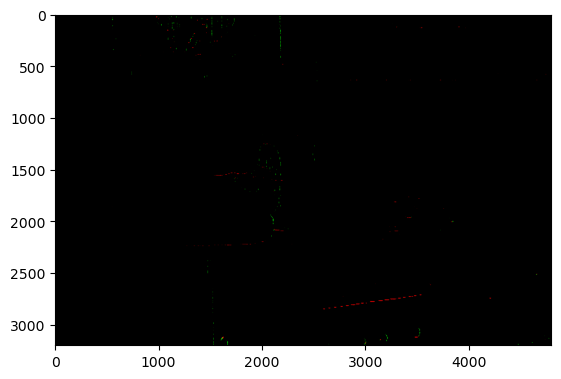

In [203]:
import numpy as np
import cv2
print(dwt2[0][0][0].shape)
test = dwt2[0][0][0]

test = (test*255).permute(1,2,0).numpy().astype(np.uint8)
# test = (test*255).permute(1,2,0).numpy() 不转整数细节会多一些，但也会导致PIL无法存图片
# r,g,b = cv2.split(test)
# print(r.shape)
# test = cv2.merge([b,g,r])
from PIL import Image
plt.imshow(test)
# Image.fromarray(test).save('wave3.png')
# plt.axis('off')
# plt.savefig('./wave.png')

In [79]:
sample = torch.randn(1, 1, 4,4)
print(sample)
A = sample[:,:,0::2, 0::2] /2
B = sample[:,:,0::2, 1::2] /2
C = sample[:,:,1::2, 0::2] /2
D = sample[:,:,1::2, 1::2] /2
print(A+B+C+D)
low, h1, h2, h3 = dwt_init(sample)
print(low)
low, high = dwt(sample)
print(low)



tensor([[[[-0.8356, -2.0978,  0.1558,  1.6310],
          [-0.6143, -1.0357,  0.8779,  0.9717],
          [ 0.6714,  0.6283,  0.7563, -0.3754],
          [ 1.5120, -0.1360,  0.5588,  1.3669]]]])
tensor([[[[-2.2917,  1.8182],
          [ 1.3379,  1.1533]]]])
tensor([[[[-2.2917,  1.8182],
          [ 1.3379,  1.1533]]]])
tensor([[[[-2.2917,  1.8182],
          [ 1.3379,  1.1533]]]])


In [108]:
import pywt
res = pywt.dwt2(x, 'haar', 'zero')
res

(array([[[[0.22745097, 0.20588234, 0.22941178, ..., 0.2352941 ,
           0.23921569, 0.23137255],
          [0.2529412 , 0.25098038, 0.16274509, ..., 0.24117646,
           0.21960783, 0.23921567],
          [0.18039215, 0.18039215, 0.13529411, ..., 0.23137254,
           0.23137254, 0.2235294 ],
          ...,
          [0.00196078, 0.00392157, 0.00392157, ..., 0.3960784 ,
           0.41764706, 0.42941177],
          [0.00980392, 0.00980392, 0.00196078, ..., 0.3745098 ,
           0.41176468, 0.42352945],
          [0.00588235, 0.00196078, 0.00392157, ..., 0.38823527,
           0.41568628, 0.4333333 ]],
 
         [[0.3215686 , 0.31176472, 0.272549  , ..., 0.3       ,
           0.29215688, 0.28235292],
          [0.34705883, 0.34117648, 0.23137255, ..., 0.29019606,
           0.28431374, 0.2862745 ],
          [0.18235293, 0.19999999, 0.13529411, ..., 0.29019606,
           0.28039217, 0.28431374],
          ...,
          [0.02745098, 0.02941176, 0.02549019, ..., 0.5568627 ,
   

In [109]:
low = res[0]
h1, h2, h3 = res[1]
print(low.shape)
print(h1.shape)


(1, 3, 200, 300)
(1, 3, 200, 300)


torch.Size([300, 3, 200])


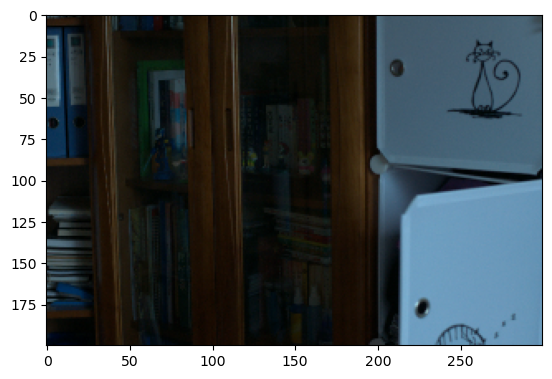

In [112]:
res = transform(low[0])
print(res.shape)
plt.imshow(res.permute(2,0, 1).numpy())

这里是直接计算的DWT

In [53]:
def dwt_init(x):
    x01 = x[:, :, 0::2, :] / 2
    x02 = x[:, :, 1::2, :] / 2
    x1 = x01[:, :, :, 0::2]
    x2 = x02[:, :, :, 0::2]
    x3 = x01[:, :, :, 1::2]
    x4 = x02[:, :, :, 1::2]
    x_LL = x1 + x2 + x3 + x4
    x_HL = -x1 - x2 + x3 + x4
    x_LH = -x1 + x2 - x3 + x4
    x_HH = x1 - x2 - x3 + x4
    # print(x_HH[:, 0, :, :])
    return torch.cat((x_LL/2, x_HL/2, x_LH/2, x_HH/2), 1)
#     return x_LL, x_HL, x_LH, x_HH

# def dwt_init(x):
#     x01 = x[:, :, 0::2, :] / 2
#     x02 = x[:, :, 1::2, :] / 2
#     x1 = x01[:, :, :, 0::2]
#     x2 = x02[:, :, :, 0::2]
#     x3 = x01[:, :, :, 1::2]
#     x4 = x02[:, :, :, 1::2]
#     x_LL = x1 + x2 + x3 + x4
#     x_HL = x1 - x2 + x3 - x4
#     x_LH = x1 + x2 - x3 - x4
#     x_HH = x1 - x2 - x3 - x4
#     # print(x_HH[:, 0, :, :])
#     return torch.cat((x_LL, x_HL, x_LH, x_HH), 1)

def iwt_init(x):
    r = 2
    in_batch, in_channel, in_height, in_width = x.size()
    out_batch, out_channel, out_height, out_width = in_batch, int(in_channel / (r ** 2)), r * in_height, r * in_width
    x1 = x[:, 0:out_channel, :, :] / 2
    x2 = x[:, out_channel:out_channel * 2, :, :] / 2
    x3 = x[:, out_channel * 2:out_channel * 3, :, :] / 2
    x4 = x[:, out_channel * 3:out_channel * 4, :, :] / 2
    h = torch.zeros([out_batch, out_channel, out_height, out_width]).cuda() #

    h[:, :, 0::2, 0::2] = x1 - x2 - x3 + x4
    h[:, :, 1::2, 0::2] = x1 - x2 + x3 - x4
    h[:, :, 0::2, 1::2] = x1 + x2 - x3 - x4
    h[:, :, 1::2, 1::2] = x1 + x2 + x3 + x4

    return h


class DWT(nn.Module):
    def __init__(self):
        super(DWT, self).__init__()
        self.requires_grad = True

    def forward(self, x):
        return dwt_init(x)


class IWT(nn.Module):
    def __init__(self):
        super(IWT, self).__init__()
        self.requires_grad = True

    def forward(self, x):
        return iwt_init(x)

torch.Size([1, 12, 200, 300])


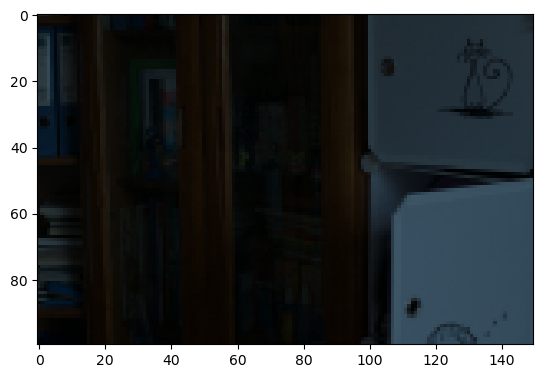

In [54]:
dwt = DWT()

dwt1 = dwt(x)
print(dwt1.shape)
dwt2 = dwt(dwt1[:, 0:3, :, :])
dwt3 = dwt(dwt2[:, 0:3, :, :])
img = dwt2[0, 0:3, :, :].permute(1,2,0).numpy()
# img = img.astype(np.uint8)
plt.imshow(img)

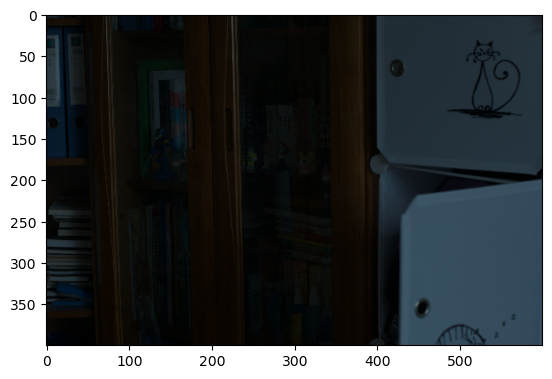

In [52]:
plt.imshow(x[0].permute(1,2,0).numpy())

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


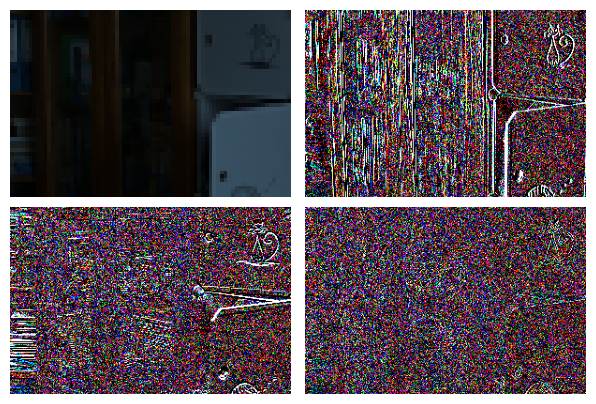

In [57]:
# plt.imshow(torch.sin(dwt1[0, 4:5, :, :] + dwt1[0,3:4, :, :]+dwt1[0, 5:6, :, :]).permute(1,2,0).numpy(), cmap='gray')
plt.subplot(2,2,1)
plt.imshow(dwt3[0, 0:3, :, :].permute(1,2,0).numpy())
plt.axis('off')
plt.subplot(2,2,2)
plt.imshow((dwt1[0, 3:6, :, :]*255).permute(1,2,0).numpy() )
plt.axis('off')
plt.subplot(2,2,3)
plt.imshow((dwt1[0, 6:9, :, :]*255).permute(1,2,0).numpy() )
plt.axis('off')
plt.subplot(2,2,4)
plt.imshow((dwt1[0, 9:12, :, :]*255).permute(1,2,0).numpy() )
plt.axis('off')
plt.subplots_adjust(top = 0.9, bottom = 0.1, right = 0.95, left = 0.05, hspace = 0.05, wspace = 0.05)    

# 同一个J的不同level和不同J的同一个level
首先同一张图片的J=2, 和J=3的第二层是一样的

In [31]:
dwt2 = DWTForward(J=2, mode = 'zero', wave='haar')
dwt3 = DWTForward(J=3, mode = 'zero', wave='haar')
_, high_freq2 = dwt2(x)
_, high_freq3 = dwt3(x)
# high_freq3[1]==high_freq2[1] #true (H/， W/4)

但是
up2 + J=2 != up2 + J=3 + up1

wt2 == wt2_inverse - > false

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


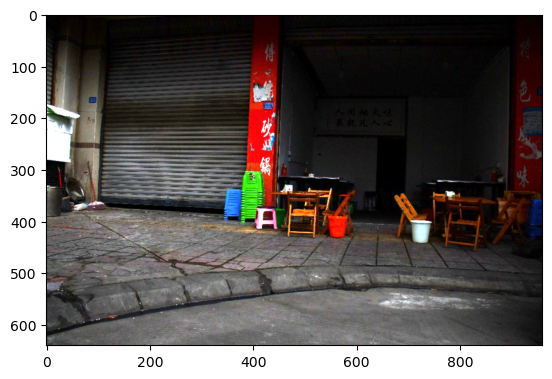

In [11]:
upsample4 = bili_resize(4)
wt2, _  = dwt2(upsample4(x))
plt.imshow(wt2[0].permute(1,2,0).numpy())

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


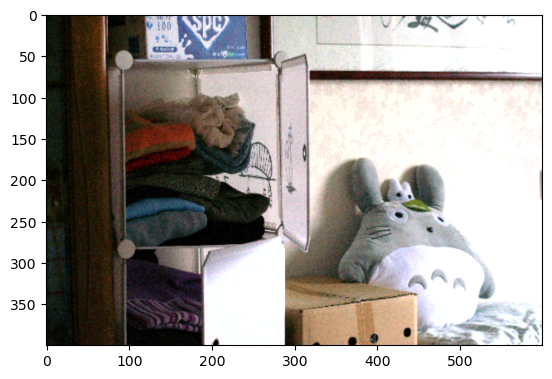

In [37]:
upsample3 = bili_resize(8)
wt3, high_freq33  = dwt3(upsample3(x)) #降到更低的维度，再回去
wt2_inverse = iwt((wt3, high_freq33[-1:]))
plt.imshow(wt3[0].permute(1,2,0).numpy())


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


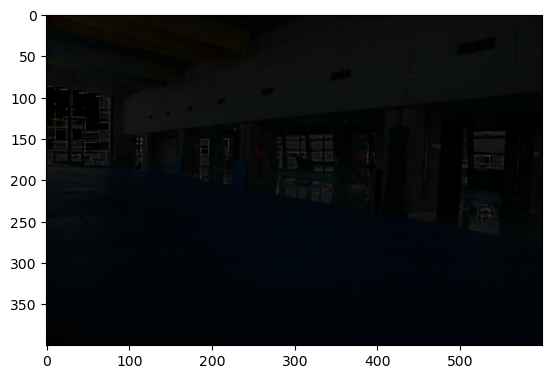

In [26]:
plt.imshow((low_inverse - x)[0].permute(1,2,0).numpy())

In [78]:
import torch.nn.functional as F
F.interpolate(x, scale_factor = 0.5, mode = 'nearest').shape

torch.Size([1, 3, 200, 300])

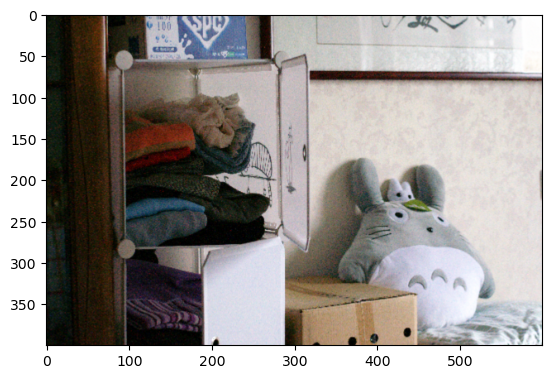

In [38]:
plt.imshow(torch.sin(wt3[0]).permute(1,2,0,).numpy()) #no sin

# fft 作用在图片上的效果

In [39]:
x_high = torch.sin(wt3)
_, _, H, W = x_high.shape
y = torch.fft.rfft2(x_high, norm='backward')
y_imag = y.imag #(N, nf, H, W/2 + 1)
y_real = y.real #(N, nf, H, W/2 + 1)

y_f = torch.cat([y_real, y_imag], dim=3) #(N, 2 * nf, H, W/2 + 1)
# y = self.main_fft(y_f) #(N, 2 * nf, H, W/2 + 1)
y_real, y_imag = torch.chunk(y_f, 2, dim=3) #(N, nf, H, W/2 + 1) * 2
y = torch.complex(y_real, y_imag) #(N, nf, H, W/2 + 1)
y_mix2 = torch.fft.irfft2(y, s=(H, W), norm='backward')

In [26]:
plt.imshow(y_mix2[0].permute(1,2,0).numpy())

NameError: name 'y_mix2' is not defined

In [182]:
from positional_encodings.torch_encodings import PositionalEncoding2D, Summer
import torch
import torch.nn as nn
import math
class PositionalEncoding(nn.Module):
    def __init__(self, d_model, height, width):
        super(PositionalEncoding, self).__init__()
        self.height = height
        self.width = width
        self.encoding = self._get_encoding(d_model, height, width)

    def _get_encoding(self, d_model, height, width):
        encoding = torch.zeros(height, width, d_model)
        pos_h = torch.arange(0, height).unsqueeze(1).float()
        pos_w = torch.arange(0, width).unsqueeze(0).float()
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * -(math.log(10000.0) / d_model))
        encoding[:, :, 0::2] = torch.sin(pos_w * div_term)
        encoding[:, :, 1::2] = torch.cos(pos_w * div_term)
        encoding[:, :, 1::2] = torch.cos(pos_h * div_term)
        encoding[:, :, 1::2] = torch.sin(pos_h * div_term)
        return encoding.unsqueeze(0).transpose(1, 3).transpose(2, 3)

    def forward(self, x):
        return x + self.encoding.to(x.device)

# Example usage:
height, width, channels = 32, 32, 3
d_model = 512
image = torch.randn(1, channels, height, width)
# image = x
# Flatten the 2D image
flat_image = image.view(1, -1, channels)

# Add positional encodings
pos_encoder = PositionalEncoding(d_model, height, width)
encoded_image = pos_encoder(flat_image)

# Reshape back to 2D
reshaped_image = encoded_image.view(1, channels, height, width)


RuntimeError: The size of tensor a (32) must match the size of tensor b (256) at non-singleton dimension 1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


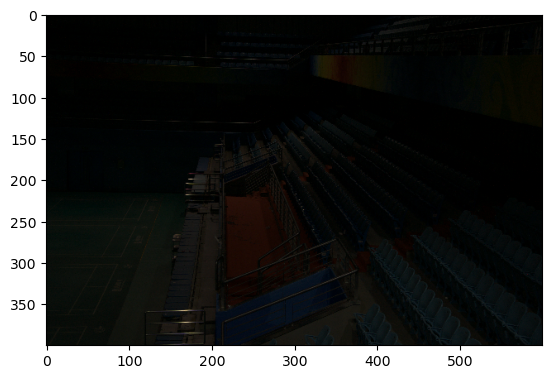

In [25]:

_, _, H, W = x.shape
y = torch.fft.rfft2(x, norm='backward')
y_imag = y.imag #(N, nf, H, W/2 + 1)
y_real = y.real #(N, nf, H, W/2 + 1)

y_f = torch.cat([y_real, y_imag], dim=3) #(N, 2 * nf, H, W/2 + 1)
# y = self.main_fft(y_f) #(N, 2 * nf, H, W/2 + 1)
y_real, y_imag = torch.chunk(y_f, 2, dim=3) #(N, nf, H, W/2 + 1) * 2
y = torch.complex(y_real, y_imag) #(N, nf, H, W/2 + 1)
y_fft = torch.fft.irfft2(y, s=(H, W), norm='backward')
plt.imshow(y_fft[0].permute(1,2,0).numpy())

In [158]:
# 效果对比
#只用了WT
from skimage import io, metrics, exposure
psnr = metrics.peak_signal_noise_ratio(torch.sin(wt3[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy())
ssim = metrics.structural_similarity(torch.sin(wt3[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy(), multichannel=True)
print("only WT, J=3:", [psnr, ssim])

#用了WT再用fft
from skimage import io, metrics, exposure
psnr = metrics.peak_signal_noise_ratio(torch.sin(y_mix[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy())
ssim = metrics.structural_similarity(torch.sin(y_mix[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy(), multichannel=True)
print("WT+fft, J=3:", [psnr, ssim])

#用了WT再用fft
from skimage import io, metrics, exposure
psnr = metrics.peak_signal_noise_ratio(torch.sin(y_mix2[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy())
ssim = metrics.structural_similarity(torch.sin(y_mix2[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy(), multichannel=True)
print("sin(WT)+fft, J=3:", [psnr, ssim])

#只用fft
from skimage import io, metrics, exposure
psnr = metrics.peak_signal_noise_ratio(torch.sin(y_fft[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy())
ssim = metrics.structural_similarity(torch.sin(y_fft[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy(), multichannel=True)
print("fft, J=3:", [psnr, ssim])

#什么都不用
from skimage import io, metrics, exposure
psnr = metrics.peak_signal_noise_ratio(torch.sin(x[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy())
ssim = metrics.structural_similarity(torch.sin(x[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy(), multichannel=True)
print("ori, J=3:", [psnr, ssim])

only WT, J=3: [20.457260652469984, 0.8255299]
WT+fft, J=3: [26.477860228987478, 0.8255299]
sin(WT)+fft, J=3: [27.754192599249397, 0.84171885]
fft, J=3: [12.123764575777576, 0.21485971]
ori, J=3: [6.103164598392618, 0.21485968]


/tmp/ipykernel_870026/1170943074.py:5: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  ssim = metrics.structural_similarity(torch.sin(wt3[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy(), multichannel=True)
/tmp/ipykernel_870026/1170943074.py:11: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  ssim = metrics.structural_similarity(torch.sin(y_mix[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy(), multichannel=True)
/tmp/ipykernel_870026/1170943074.py:17: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  ssim = metrics.structural_similarity(torch.sin(y_mix2[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy(), multichannel=True)
/tmp/ipykernel_

In [81]:
from skimage import io, metrics, exposure

psnr = metrics.peak_signal_noise_ratio(wt3[0].permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy())
ssim = metrics.structural_similarity(wt3[0].permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy(), multichannel=True)
print(" WT, J=3:", [psnr, ssim])

psnr = metrics.peak_signal_noise_ratio(torch.sin(wt3[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy())
ssim = metrics.structural_similarity(torch.sin(wt3[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy(), multichannel=True)
print("sin WT, J=3:", [psnr, ssim])

#用了WT再用fft
# from skimage import io, metrics, exposure
# psnr = metrics.peak_signal_noise_ratio(torch.sin(y_mix[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy())
# ssim = metrics.structural_similarity(torch.sin(y_mix[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy(), multichannel=True)
# print("WT+fft, J=3:", [psnr, ssim])

#用了WT再用fft
from skimage import io, metrics, exposure
psnr = metrics.peak_signal_noise_ratio(torch.sin(y_mix2[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy())
ssim = metrics.structural_similarity(torch.sin(y_mix2[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy(), multichannel=True)
print("sin(WT)+fft, J=3:", [psnr, ssim])

#只用fft
from skimage import io, metrics, exposure
psnr = metrics.peak_signal_noise_ratio(torch.sin(y_fft[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy())
ssim = metrics.structural_similarity(torch.sin(y_fft[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy(), multichannel=True)
print("fft, J=3:", [psnr, ssim])

#什么都不用
from skimage import io, metrics, exposure
psnr = metrics.peak_signal_noise_ratio(torch.sin(x[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy())
ssim = metrics.structural_similarity(torch.sin(x[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy(), multichannel=True)
print("ori, J=3:", [psnr, ssim])

ValueError: image_true has intensity values outside the range expected for its data type. Please manually specify the data_range.

# attention

In [231]:
class SALayer(nn.Module):
    def __init__(self, kernel_size=5, bias=False):
        super(SALayer, self).__init__()
        self.conv_du = nn.Sequential(
            nn.Conv2d(2, 1, kernel_size=kernel_size, stride=1, padding=(kernel_size - 1) // 2, bias=bias),
            nn.Sigmoid()
        )

    def forward(self, x):
        # torch.max will output 2 things, and we want the 1st one
        max_pool, _ = torch.max(x, dim=1, keepdim=True)
        avg_pool = torch.mean(x, 1, keepdim=True)
        channel_pool = torch.cat([max_pool, avg_pool], dim=1)  # [N,2,H,W]  could add 1x1 conv -> [N,3,H,W]
        y = self.conv_du(channel_pool)

        return x * y

##########################################################################
# Channel Attention Layer
class CALayer(nn.Module):
    def __init__(self, channel, reduction=16, bias=False):
        super(CALayer, self).__init__()
        # global average pooling: feature --> point
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        # feature channel downscale and upscale --> channel weight
        self.conv_du = nn.Sequential(
            nn.Conv2d(channel, channel // reduction, 1, padding=0, bias=bias),
            nn.ReLU(inplace=True),
            nn.Conv2d(channel // reduction, channel, 1, padding=0, bias=bias),
            nn.Sigmoid()
        )

    def forward(self, x):
        y = self.avg_pool(x)
        y = self.conv_du(y)
        return x * y
main_wt = nn.Sequential(nn.Conv2d(3, 3, kernel_size = 3, stride = 1, bias = True), 
                        nn.Conv2d(3, 3,kernel_size = 3,stride = 1,bias =  False))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


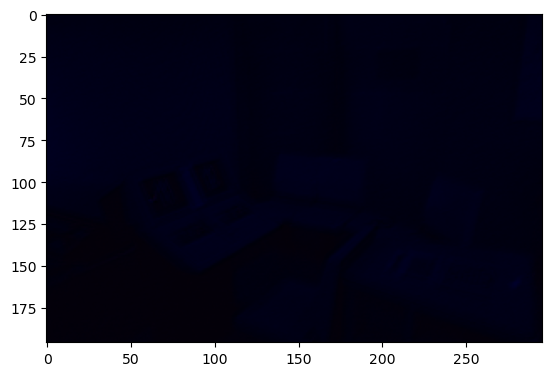

In [237]:
sa = SALayer()
ca = CALayer(3, reduction = 1, bias = False)
wt = main_wt(torch.sin(dwt1))
branch_sa = sa(wt)
branch_ca = ca(wt)
plt.imshow(branch_sa[0].permute(1,2,0).detach().numpy())

# save image

In [74]:
from PIL import Image
import numpy as np
to_img = torch.sin(dwt1[0]).permute(1,2,0,).numpy()
to_img = (255 * to_img).astype(np.uint8) 
Image.fromarray(to_img).save('./WT.jpg')

# PSNR/SSIM/Lpips

In [57]:
from skimage import io, metrics, exposure
psnr = metrics.peak_signal_noise_ratio(torch.sin(dwt1[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy())
ssim = metrics.structural_similarity(torch.sin(dwt1[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy(), multichannel=True)
print("J=4:", [psnr, ssim])

J=4: [7.782391385606741, 0.4133815]


/tmp/ipykernel_591803/1074144508.py:3: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  ssim = metrics.structural_similarity(torch.sin(dwt1[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy(), multichannel=True)


In [146]:
from skimage import io, metrics, exposure
psnr = metrics.peak_signal_noise_ratio(torch.sin(wt3[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy())
ssim = metrics.structural_similarity(torch.sin(wt3[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy(), multichannel=True)
print("J=3:", [psnr, ssim])

J=3: [27.754192599249397, 0.84171885]


/tmp/ipykernel_870026/3763746035.py:3: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  ssim = metrics.structural_similarity(torch.sin(y[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy(), multichannel=True)


In [46]:
from skimage import io, metrics, exposure
psnr = metrics.peak_signal_noise_ratio(torch.sin(low_inverse[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy())
ssim = metrics.structural_similarity(torch.sin(low_inverse[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy(), multichannel=True)
print("J=2:", [psnr, ssim])

J=2: [16.741440971204653, 0.646725]


/tmp/ipykernel_870026/40816869.py:3: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  ssim = metrics.structural_similarity(torch.sin(low_inverse[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy(), multichannel=True)


In [280]:
from skimage import io, metrics, exposure
psnr = metrics.peak_signal_noise_ratio(torch.sin(dwt1[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy())
ssim = metrics.structural_similarity(torch.sin(dwt1[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy(), multichannel=True)
print("J=1:", [psnr, ssim])

J=1: [10.798433924068737, 0.479938]


/tmp/ipykernel_2708181/3704364590.py:3: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  ssim = metrics.structural_similarity(torch.sin(dwt1[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy(), multichannel=True)


In [ ]:
#              J=1              J=2                J=3               J=4
#1.png     9.83/0.4834         15.82/0.7515      19.76/0.8138       9.09/0.3556
# 22.png   7.78/0.4134         12.12/0.6882      20.50/0.8344       18.56/0.6634
# 55.png   5.18/0.1760          6.60/0.3328       9.72/0.5215        14.74/0.6304   
# 79.png   6.65/0.4409         16.65/0.7433      27.85/0.8804       18.76/0.6309
#111.png   7.08/0.4149         10.71/0.7070     26.78/0.8585      14.96/0.7120
#493.png   12.01/0.3580        14.60/0.5450     19.71/0.7240        14.48/0.7083
#547.png   10.80/0.4799        15.96/0.7862      20.69/0.8516        8.66/0.6145
#179.png   16.32/0.7748        25.85/0.8961        10.67/0.6572        11.02/0.3236
#665.png   7.48/0.1938         8.93/0.3708       12.38/0.5873        23.33/0.6399
#669.png   8.24/0.4161        11.97/0.6992        20.57/0.8195     16.89/0.646
#748.png   11.55/0.4329       21.57/0.7347        26.09/0.8196     15.58/0.5825
#778.png    9.81/0.2033       11.93/0.3949      22.69/0.6139        21.52/0.6545

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


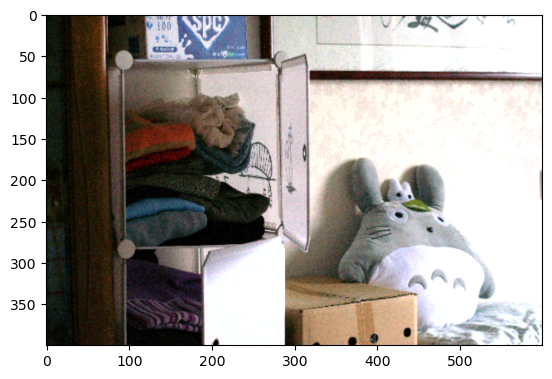

In [183]:
plt.imshow(wt3[0].permute(1,2,0).numpy())

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


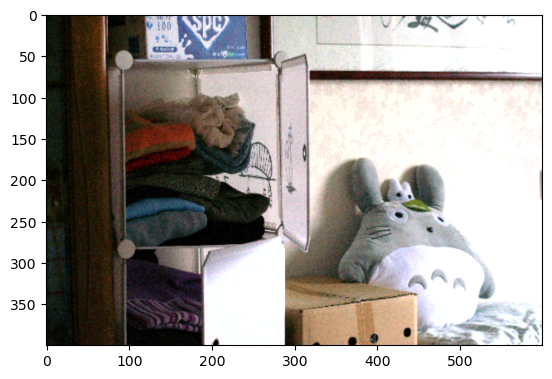

In [166]:
B, C, H, W = wt3.shape
wt3 = wt3.view(B, H*W, C)
wt3 = wt3.view(B, C, H, W)
plt.imshow(wt3[0].permute(1,2,0).numpy())

# 把所有的图片用wt处理看看总分

In [37]:
import os
import tqdm
import matplotlib.pyplot as plt
low = '/workspace/AdBRC/tszhang/github/LLE/data/LOLv2/Real_captured/Test/low/'
high = '/workspace/AdBRC/tszhang/github/LLE/data/LOLv2/Real_captured/Test/high/'
# high_wt = '/workspace/AdBRC/tszhang/github/LLE/data/LOLdataset/eval15/high_wt_fft/'
import cv2
from skimage import io, metrics, exposure
dwt3 = DWTForward(J=3, mode = 'zero', wave='haar')
lists = os.listdir(low)

psnr_wt = []
ssim_wt = []

psnr_wf = []
ssim_wf = []
for i in lists:
    if 'png' not in i:
        continue

    img = Image.open(low+i)
    gt = Image.open(high+i.replace('low', 'normal'))
    img = transform(img)
    gt = transform(gt)
    C, H, W = gt.shape
    x_big = upsample(upsample(upsample(img.unsqueeze(0))))
    dwt1, dwt2 = dwt3(x_big)
    psnr = metrics.peak_signal_noise_ratio(torch.sin(dwt1)[0].permute(1,2,0).numpy(), gt.permute(1,2,0).numpy())
    ssim = metrics.structural_similarity(torch.sin(dwt1)[0].permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy(), multichannel=True)
#     print(i)
#     print(psnr)
#     print(ssim)
    psnr_wt.append(psnr)
    ssim_wt.append(ssim)
    #count score with only WT
    
    y = torch.fft.rfft2(torch.sin(dwt1), norm='backward')
    y_imag = y.imag #(N, nf, H, W/2 + 1)
    y_real = y.real #(N, nf, H, W/2 + 1)

    y_f = torch.cat([y_real, y_imag], dim=3) #(N, 2 * nf, H, W/2 + 1)
    # y = self.main_fft(y_f) #(N, 2 * nf, H, W/2 + 1)
    y_real, y_imag = torch.chunk(y_f, 2, dim=3) #(N, nf, H, W/2 + 1) * 2
    y = torch.complex(y_real, y_imag) #(N, nf, H, W/2 + 1)
    y_fft = torch.fft.irfft2(y, s=(H, W), norm='backward')
    test = y_fft #在这里数值还是正常的

    
    #count score with fft
    psnr = metrics.peak_signal_noise_ratio(torch.sin(test)[0].permute(1,2,0).numpy(), gt.permute(1,2,0).numpy())
    ssim = metrics.structural_similarity(torch.sin(test)[0].permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy(), multichannel=True)
#     print(psnr)
#     print(ssim)
    psnr_wf.append(psnr)
    ssim_wf.append(ssim)

#     print('\n')
    

/tmp/ipykernel_2403919/321934075.py:29: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  ssim = metrics.structural_similarity(torch.sin(dwt1)[0].permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy(), multichannel=True)
/tmp/ipykernel_2403919/321934075.py:51: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  ssim = metrics.structural_similarity(torch.sin(test)[0].permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy(), multichannel=True)


In [38]:
print('using only WT: ',np.mean(psnr_wt), np.mean(ssim_wt))
print('using WT+fft: ', np.mean(psnr_wf), np.mean(ssim_wf))

using only WT:  18.233377846183522 0.6971934
using WT+fft:  21.438609755943013 0.71686524


In [43]:
import os
import tqdm
import matplotlib.pyplot as plt
low = '/workspace/AdBRC/tszhang/github/LLE/data/LOLv2/Synthetic/Test/low/'
high = '/workspace/AdBRC/tszhang/github/LLE/data/LOLv2/Synthetic/Test/high/'
# high_wt = '/workspace/AdBRC/tszhang/github/LLE/data/LOLdataset/eval15/high_wt_fft/'
import cv2
from skimage import io, metrics, exposure
dwt3 = DWTForward(J=1, mode = 'zero', wave='haar')
lists = os.listdir(low)

psnr_wt = []
ssim_wt = []

psnr_wf = []
ssim_wf = []
for i in lists:
    if 'png' not in i:
        continue

    img = Image.open(low+i)
    gt = Image.open(high+i)
    img = transform(img)
    gt = transform(gt)
    C, H, W = gt.shape
    x_big = upsample(img.unsqueeze(0))
    dwt1, dwt2 = dwt3(x_big)
    psnr = metrics.peak_signal_noise_ratio(torch.sin(dwt1)[0].permute(1,2,0).numpy(), gt.permute(1,2,0).numpy())
    ssim = metrics.structural_similarity(torch.sin(dwt1)[0].permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy(), multichannel=True)
#     print(i)
#     print(psnr)
#     print(ssim)
    psnr_wt.append(psnr)
    ssim_wt.append(ssim)
    #count score with only WT
    
    y = torch.fft.rfft2(torch.sin(dwt1), norm='backward')
    y_imag = y.imag #(N, nf, H, W/2 + 1)
    y_real = y.real #(N, nf, H, W/2 + 1)

    y_f = torch.cat([y_real, y_imag], dim=3) #(N, 2 * nf, H, W/2 + 1)
    # y = self.main_fft(y_f) #(N, 2 * nf, H, W/2 + 1)
    y_real, y_imag = torch.chunk(y_f, 2, dim=3) #(N, nf, H, W/2 + 1) * 2
    y = torch.complex(y_real, y_imag) #(N, nf, H, W/2 + 1)
    y_fft = torch.fft.irfft2(y, s=(H, W), norm='backward')
    test = y_fft #在这里数值还是正常的


    #count score with fft
    psnr = metrics.peak_signal_noise_ratio(torch.sin(test)[0].permute(1,2,0).numpy(), gt.permute(1,2,0).numpy())
    ssim = metrics.structural_similarity(torch.sin(test)[0].permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy(), multichannel=True)
#     print(psnr)
#     print(ssim)
    psnr_wf.append(psnr)
    ssim_wf.append(ssim)

#     print('\n')
    

/tmp/ipykernel_2403919/2871886079.py:29: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  ssim = metrics.structural_similarity(torch.sin(dwt1)[0].permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy(), multichannel=True)
/tmp/ipykernel_2403919/2871886079.py:51: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  ssim = metrics.structural_similarity(torch.sin(test)[0].permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy(), multichannel=True)


In [44]:
print('using only WT: ',np.mean(psnr_wt), np.mean(ssim_wt))
print('using WT+fft: ', np.mean(psnr_wf), np.mean(ssim_wf))

using only WT:  13.571878808006693 0.63603485
using WT+fft:  19.056158292049098 0.64024824


# 分析RGB直方图分布，对比GT和WT

In [317]:
import cv2
# r, g, b = cv2.split(gt.permute(1,2,0).numpy())
r, g, b = cv2.split(torch.sin(low1[0]).permute(1,2,0).numpy())
# r, g, b = cv2.split(torch.sin(wt2[0]).permute(1,2,0).numpy())
# r, g, b = cv2.split(y_mix2[0].permute(1,2,0).numpy())



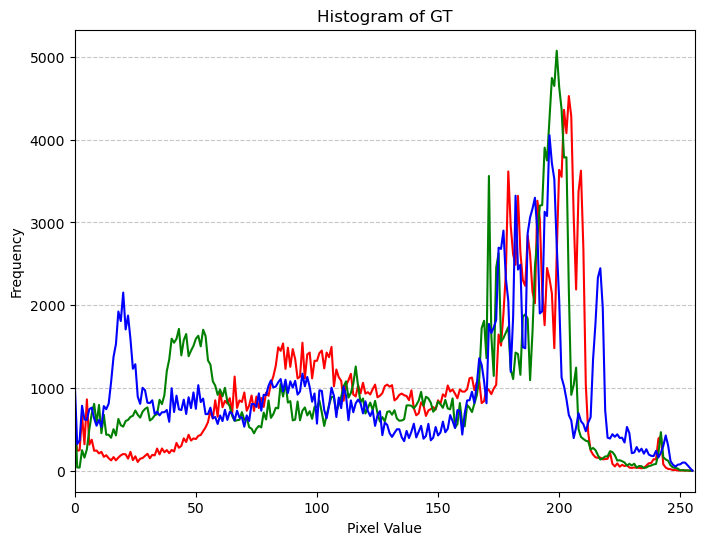

In [45]:
hist1 = cv2.calcHist([r ], [0], None, [256], [0, 1])
hist2 = cv2.calcHist([g ], [0], None, [256], [0, 1])
hist3 = cv2.calcHist([b ], [0], None, [256], [0, 1])
# Flatten the histogram into a 1D array
# hist = hist.flatten()

# Plot the histogram
plt.figure(figsize=(8, 6))
plt.title('Histogram of GT')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.xlim([0, 256])  # Set the x-axis range from 0 to 255
plt.plot(hist1, color='red')
plt.plot(hist2, color='green')
plt.plot(hist3, color='blue')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

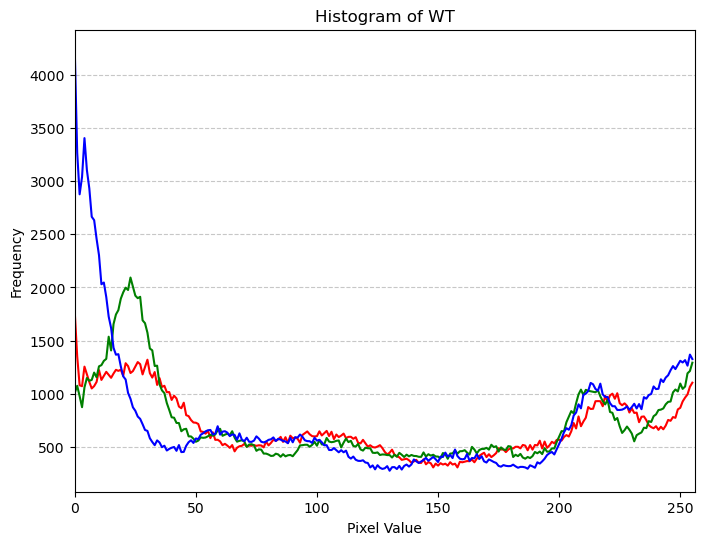

In [43]:
hist1 = cv2.calcHist([r ], [0], None, [256], [0, 1])
hist2 = cv2.calcHist([g ], [0], None, [256], [0, 1])
hist3 = cv2.calcHist([b ], [0], None, [256], [0, 1])
# Flatten the histogram into a 1D array
# hist = hist.flatten()

# Plot the histogram
plt.figure(figsize=(8, 6))
plt.title('Histogram of WT')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.xlim([0, 256])  # Set the x-axis range from 0 to 255
plt.plot(hist1, color='red')
plt.plot(hist2, color='green')
plt.plot(hist3, color='blue')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

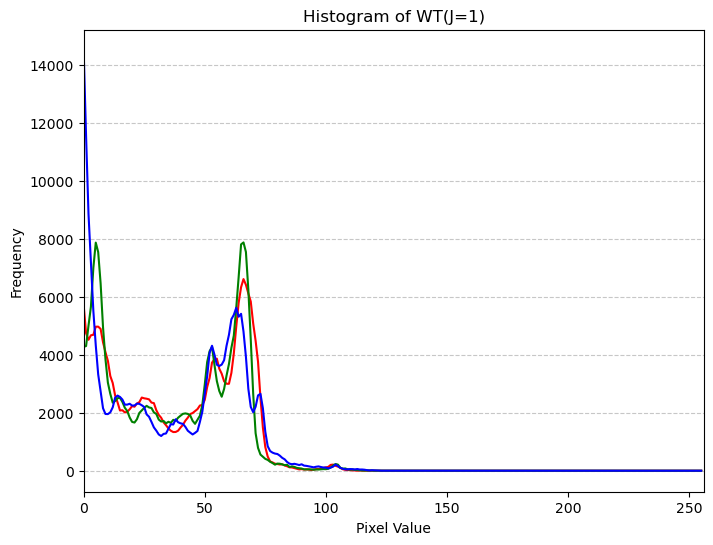

In [318]:
hist1 = cv2.calcHist([r ], [0], None, [256], [0, 1])
hist2 = cv2.calcHist([g ], [0], None, [256], [0, 1])
hist3 = cv2.calcHist([b ], [0], None, [256], [0, 1])
# Flatten the histogram into a 1D array
# hist = hist.flatten()

# Plot the histogram
plt.figure(figsize=(8, 6))
plt.title('Histogram of WT(J=1)')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.xlim([0, 256])  # Set the x-axis range from 0 to 255
plt.plot(hist1, color='red')
plt.plot(hist2, color='green')
plt.plot(hist3, color='blue')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

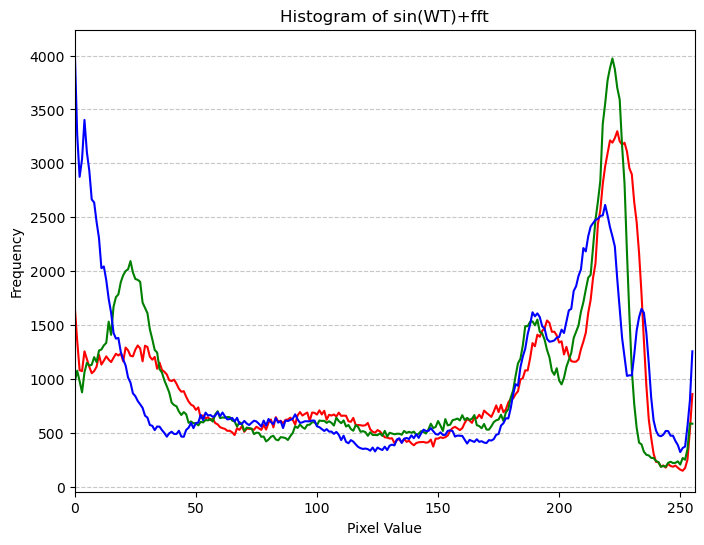

In [51]:
hist1 = cv2.calcHist([r ], [0], None, [256], [0, 1])
hist2 = cv2.calcHist([g ], [0], None, [256], [0, 1])
hist3 = cv2.calcHist([b ], [0], None, [256], [0, 1])
# Flatten the histogram into a 1D array
# hist = hist.flatten()

# Plot the histogram
plt.figure(figsize=(8, 6))
plt.title('Histogram of sin(WT)+fft')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.xlim([0, 256])  # Set the x-axis range from 0 to 255
plt.plot(hist1, color='red')
plt.plot(hist2, color='green')
plt.plot(hist3, color='blue')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [67]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components = 2)
gt_tsne = tsne.fit_transform(gt.numpy())

ValueError: perplexity must be less than n_samples

In [76]:
gt_gray = cv2.cvtColor(gt.permute(1,2,0).numpy(), cv2.COLOR_RGB2GRAY)
wt_gray = cv2.cvtColor(torch.sin(wt3[0]).permute(1,2,0).numpy(), cv2.COLOR_RGB2GRAY)
wtfft_gray = cv2.cvtColor(torch.sin(y_mix2[0]).permute(1,2,0).numpy(), cv2.COLOR_RGB2GRAY)
gt_tsne = tsne.fit_transform(gt_gray)
wt_tsne = tsne.fit_transform(wt_gray)
wtfft_tsne = tsne.fit_transform(wtfft_gray)

(400, 2)

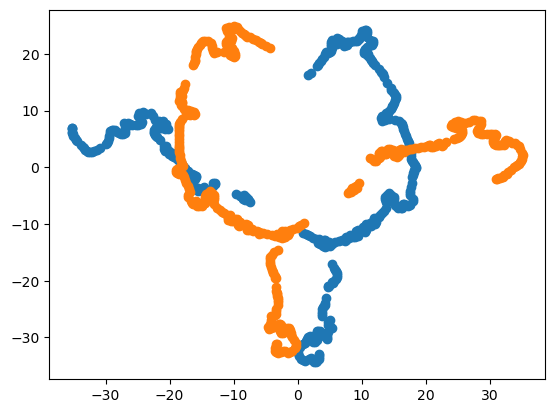

In [78]:
plt.scatter(gt_tsne[:, 0], gt_tsne[:, 1])
plt.scatter(wt_tsne[:, 0], wt_tsne[:, 1])
# plt.scatter(wtfft_tsne[:, 0], wtfft_tsne[:, 1])

# wavelet pyramid

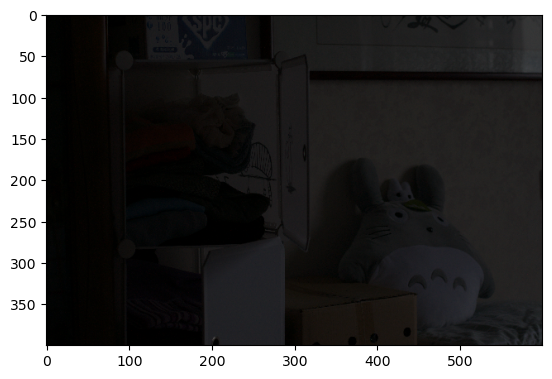

In [91]:
dwt1 = DWTForward(J=1, mode = 'zero', wave='haar')
dwt2 = DWTForward(J=2, mode = 'zero', wave='haar')
dwt3 = DWTForward(J=3, mode = 'zero', wave='haar')
plt.imshow(x[0].permute(1,2,0).numpy())

In [315]:
dwt = DWT()
# x = gt.unsqueeze(0)
low1, high11, high12, high13 = dwt(upsample(x))
low2, high21, high22, high23 = dwt(low1)
low3, high31, high32, high33 = dwt(low2)

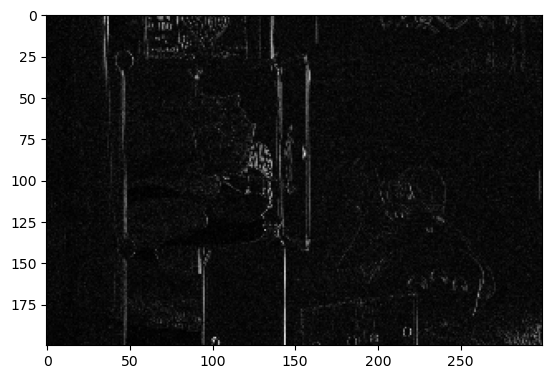

In [291]:

# high1[0][0][0].shape
def plot_high(x):
    
    x = (np.abs(x)*255).permute(1,2,0).numpy()
#     r, g, b = cv2.split(x)
#     x = r + g + b
    x = cv2.cvtColor(x, cv2.COLOR_RGB2GRAY)
    return x
# plt.imshow(plot_high(high1[0][0][2]))
plt.imshow(plot_high(high11[0]), cmap='gray')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


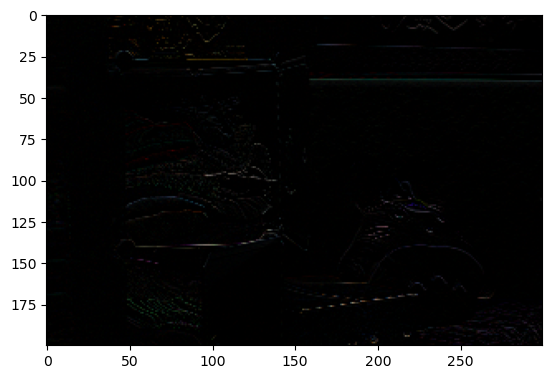

In [276]:
plt.imshow((high12[0]).permute(1,2,0).numpy())

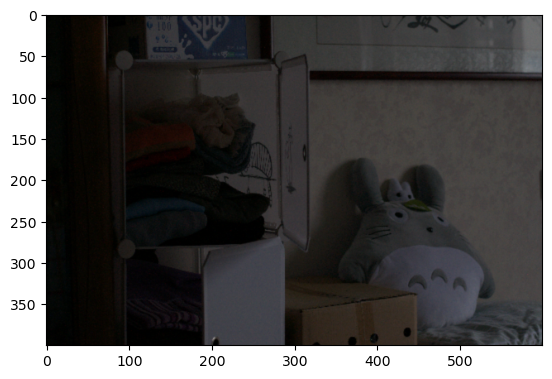

In [316]:
plt.imshow(low1[0].permute(1,2,0).numpy())

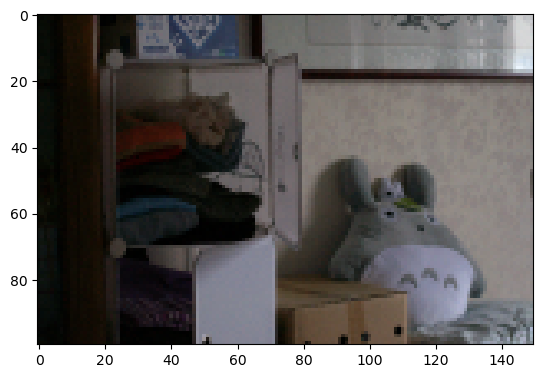

In [127]:
plt.imshow(low2[0].permute(1,2,0).numpy())

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


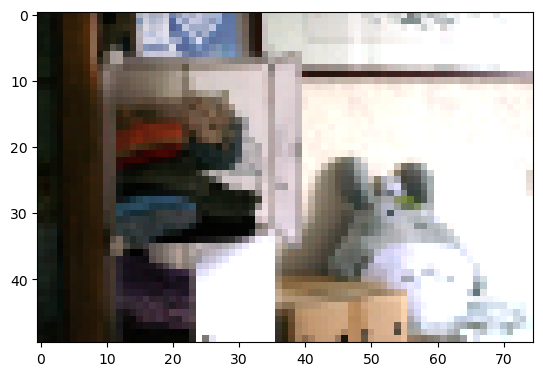

In [128]:
plt.imshow(low3[0].permute(1,2,0).numpy())

# 将所有图片用wavelet生成一个pseudo gt

### 只用wt

In [82]:
import os
import tqdm
import matplotlib.pyplot as plt
low = '/workspace/AdBRC/tszhang/github/LLE/data/LOLdataset/our485/low/'
high_wt = '/workspace/AdBRC/tszhang/github/LLE/data/LOLdataset/our485/high_wt/'
import cv2
lists = os.listdir(low)
for i in lists:
    if 'png' not in i:
        continue
    img = Image.open(low+i)
    img = transform(img)
    x_big = upsample(upsample(upsample(img.unsqueeze(0))))
    dwt1, dwt2 = dwt3(x_big)
    test = torch.sin(dwt1[0]).permute(1,2,0).numpy()
    test = (test*255).astype(np.uint8)
    Image.fromarray(test).save(high_wt + i)
#     break
# test

### wt+fft

In [133]:
import os
import tqdm
import matplotlib.pyplot as plt
low = '/workspace/AdBRC/tszhang/github/LLE/data/LOLdataset/eval15/low/'
high_wt = '/workspace/AdBRC/tszhang/github/LLE/data/LOLdataset/eval15/high_wt_fft/'
import cv2
lists = os.listdir(low)
for i in lists:
    if 'png' not in i:
        continue
    img = Image.open(low+i)
    img = transform(img)
    x_big = upsample(upsample(upsample(img.unsqueeze(0))))
    dwt1, dwt2 = dwt3(x_big)

    y = torch.fft.rfft2(torch.sin(dwt1), norm='backward')
    y_imag = y.imag #(N, nf, H, W/2 + 1)
    y_real = y.real #(N, nf, H, W/2 + 1)

    y_f = torch.cat([y_real, y_imag], dim=3) #(N, 2 * nf, H, W/2 + 1)
    # y = self.main_fft(y_f) #(N, 2 * nf, H, W/2 + 1)
    y_real, y_imag = torch.chunk(y_f, 2, dim=3) #(N, nf, H, W/2 + 1) * 2
    y = torch.complex(y_real, y_imag) #(N, nf, H, W/2 + 1)
    y_fft = torch.fft.irfft2(y, s=(400, 600), norm='backward')
    test = y_fft #在这里数值还是正常的
#     test = torch.sin(y_fft[0]).permute(1,2,0).numpy()
#     test = test*255
#     r,g,b=cv2.split(test)
#     test = cv2.merge([b,g,r])
#     test = (test*255).astype(np.uint8)
#     cv2.imwrite(high_wt + i,test)
    break
#     Image.fromarray(test).save(high_wt + i)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


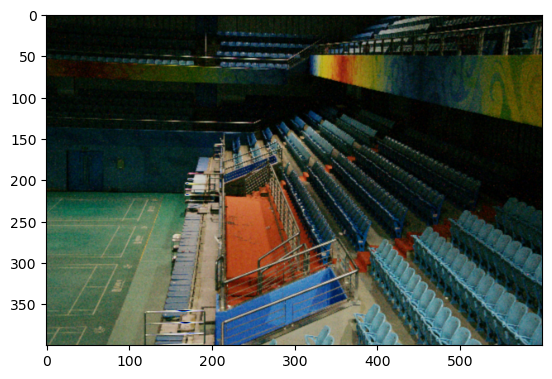

In [131]:
plt.imshow(test)

In [139]:
from skimage import io, metrics, exposure
psnr = metrics.peak_signal_noise_ratio(torch.sin(transform(test2)).permute(1,2,0).numpy(), gt.permute(1,2,0).numpy())
ssim = metrics.structural_similarity(torch.sin(transform(test2)).permute(1,2,0).numpy(), gt.permute(1,2,0).numpy(), multichannel=True)
print("only WT, J=3:", [psnr, ssim])

only WT, J=3: [16.099847560253018, 0.60845584]


/tmp/ipykernel_2678928/1872049211.py:3: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  ssim = metrics.structural_similarity(torch.sin(transform(test2)).permute(1,2,0).numpy(), gt.permute(1,2,0).numpy(), multichannel=True)


In [135]:
test2 = Image.open(high_wt + '778.png')


In [136]:
np.array(test2).shape

(400, 600, 3)

In [59]:
from torch_geometric.nn.conv.gatv2_conv import GATv2Conv
from torch_geometric.nn import GCNConv
# encoder = GATv2Conv(64, 64)
adj_matrix = torch.FloatTensor([
        [0, 1, 0, 0],
        [0, 0, 1, 1],
        [0, 1, 0, 0],
        [1, 0, 1, 0]
    ])
encoder = GCNConv(adj_matrix, num_embeddings=4, hidden_features=80, out_channels = 4)
test_tensor = torch.randint(low=0, high=3, size=(4,))
encoder(test_tensor)

RuntimeError: Boolean value of Tensor with more than one value is ambiguous

In [51]:
from pdb import set_trace as stx
class LAM_Module_v2(nn.Module):  
    """ Layer attention module"""
    def __init__(self, in_dim,bias=True):
        super(LAM_Module_v2, self).__init__()
        self.chanel_in = in_dim

        self.temperature = nn.Parameter(torch.ones(1))

        self.qkv = nn.Conv2d( self.chanel_in ,  self.chanel_in *3, kernel_size=1, bias=bias)
        self.qkv_dwconv = nn.Conv2d(self.chanel_in*3, self.chanel_in*3, kernel_size=3, stride=1, padding=1, groups=self.chanel_in*3, bias=bias)
        self.project_out = nn.Conv2d(self.chanel_in, self.chanel_in, kernel_size=1, bias=bias)

    def forward(self,x):
        """
            inputs :
                x : input feature maps( B X N X C X H X W)
            returns :
                out : attention value + input feature
                attention: B X N X N
        """
        m_batchsize, N, C, height, width = x.size()

        x_input = x.view(m_batchsize,N*C, height, width)
        qkv = self.qkv_dwconv(self.qkv(x_input))
        
        q, k, v = qkv.chunk(3, dim=1)
        print(q.shape)
        print(k.shape)
        q = q.view(m_batchsize, N, -1)
        k = k.view(m_batchsize, N, -1)
        v = v.view(m_batchsize, N, -1)
        
        q = torch.nn.functional.normalize(q, dim=-1)
        k = torch.nn.functional.normalize(k, dim=-1)
        print(q.shape)
        attn = (q @ k.transpose(-2, -1)) * self.temperature
        attn = attn.softmax(dim=-1)
        print(attn.shape)
        out_1 = (attn @ v)
        out_1 = out_1.view(m_batchsize, -1, height, width)

        out_1 = self.project_out(out_1)
        out_1 = out_1.view(m_batchsize, N, C, height, width)

        out = out_1+x
        out = out.view(m_batchsize, -1, height, width)
        return out

llf = LAM_Module_v2(in_dim = 16 * 3)
llf(torch.rand(1, 3, 16, 64, 64))

torch.Size([1, 48, 64, 64])
torch.Size([1, 48, 64, 64])
torch.Size([1, 3, 65536])
torch.Size([1, 3, 3])


tensor([[[[ 0.7894,  0.2340,  0.7501,  ...,  0.7064,  0.4379,  0.3221],
          [ 0.0424,  0.6874,  0.0506,  ...,  0.7098, -0.1879,  0.0869],
          [ 0.0832,  0.7848,  0.6748,  ..., -0.2524, -0.2078,  0.1231],
          ...,
          [ 0.5221, -0.1195,  0.0735,  ...,  0.5593,  0.7612,  0.3738],
          [ 0.7025, -0.1062,  0.5007,  ...,  0.2159,  0.5872, -0.0722],
          [ 0.7651,  0.8270,  0.4582,  ...,  0.5306,  0.3900, -0.0989]],

         [[ 0.5259,  0.3038,  0.3922,  ...,  0.5704,  0.1268,  0.5485],
          [ 0.2047,  0.7560,  0.7630,  ..., -0.0218,  0.0172,  0.2782],
          [ 0.3963, -0.0211, -0.1877,  ...,  0.1890, -0.1845,  0.5654],
          ...,
          [ 0.6131,  0.1923,  0.0753,  ...,  0.1404,  0.1554,  0.0257],
          [ 0.5986,  0.5158,  0.7602,  ...,  0.0261, -0.1303,  0.3033],
          [ 0.6887,  0.2474,  0.2547,  ...,  0.0677,  0.2929,  0.4561]],

         [[ 0.0589,  0.6111,  0.0334,  ...,  0.2670,  0.5940,  0.5436],
          [ 0.8516,  0.4874,  

In [324]:
A = np.random.rand(5, 50, 50)
B = np.random.rand(5, 50, 50)
from scipy import stats
f_stat, p = stats.f_oneway(A, B)

(50, 50)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


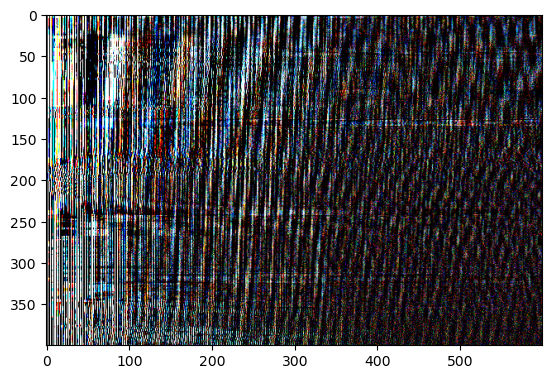

In [114]:
import torch_dct as dct
x_dct = dct.dct(x)
plt.imshow(x_dct[0].permute(1,2,0).numpy())

In [116]:
from scipy.fftpack import dct as dct_sci

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


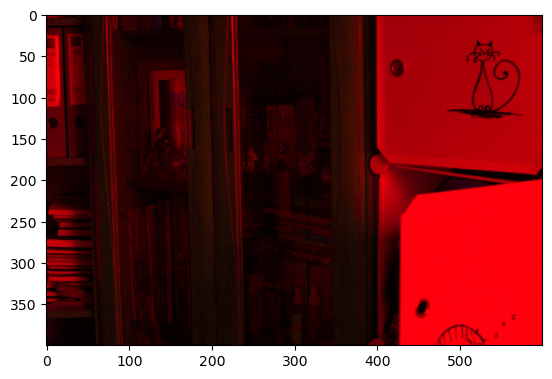

In [133]:
plt.imshow(dct_sci(x[0].permute(1,2,0).numpy(), 3)) #k可以有4种数值

In [124]:
x_dct

tensor([[[[ 9.0439e+01, -2.8382e+01,  1.8922e+01,  ...,  4.9707e-01,
            5.7231e-01, -2.7635e-01],
          [ 9.0220e+01, -2.7576e+01,  1.9441e+01,  ...,  3.6578e-01,
           -2.2848e-02, -2.4304e-01],
          [ 9.0196e+01, -2.8003e+01,  1.8665e+01,  ...,  5.9754e-02,
            3.0425e-01, -6.5547e-02],
          ...,
          [ 9.2769e+01, -5.3919e+01,  2.7750e+01,  ..., -1.5537e-01,
           -3.0441e-01,  1.0584e-01],
          [ 9.2290e+01, -5.3075e+01,  2.7602e+01,  ..., -2.6749e-01,
           -1.0828e-01,  6.7700e-02],
          [ 9.2518e+01, -5.3539e+01,  2.7705e+01,  ...,  3.0393e-01,
            6.9411e-03, -1.5813e-01]],

         [[ 1.0956e+02, -4.1189e+01,  3.0425e+01,  ...,  5.1719e-02,
            4.2158e-02,  5.6910e-02],
          [ 1.0927e+02, -4.1157e+01,  3.0776e+01,  ...,  1.1695e-01,
           -2.2048e-01,  7.4775e-02],
          [ 1.1035e+02, -4.0641e+01,  3.0492e+01,  ...,  3.5871e-01,
           -2.1972e-01, -6.0423e-02],
          ...,
     

In [128]:
dct_sci(x[0].permute(1,2,0).numpy(), 3)

array([[[ 0.49053288, -0.21960784, -0.0121015 ],
        [ 0.6389894 , -0.31372553,  0.02767728],
        [ 0.6293262 , -0.3098039 ,  0.04518355],
        ...,
        [ 0.5365409 , -0.21568626,  0.02032184],
        [ 0.5054499 , -0.19607842,  0.04356969],
        [ 0.5072699 , -0.19607842,  0.01822027]],

       [[ 0.5707843 , -0.25882354,  0.04098047],
        [ 0.62540466, -0.26666665,  0.04126202],
        [ 0.6604172 , -0.30588233,  0.02193573],
        ...,
        [ 0.5375917 , -0.19607845,  0.03495735],
        [ 0.5140623 , -0.20784315,  0.01142792],
        [ 0.54151326, -0.19215688,  0.03887892]],

       [[ 0.64578176, -0.2901961 ,  0.02088493],
        [ 0.6214831 , -0.2588235 ,  0.03734045],
        [ 0.6721819 , -0.30588233,  0.03370044],
        ...,
        [ 0.51798385, -0.18039218,  0.01534948],
        [ 0.5336701 , -0.20000002,  0.03103577],
        [ 0.5111915 , -0.18039215,  0.02214183]],

       ...,

       [[ 0.08494218, -0.09019609,  0.01701861],
        [ 0

In [137]:
import pywt
L, (H, V, D) = pywt.dwt2(np.ones((4,4)), 'haar')
L

array([[2., 2.],
       [2., 2.]])

# 交换LL


In [8]:
gt2 = gt.unsqueeze(0)
gt_l, gt_h = dwt(gt2)
x_l, x_h = dwt(x)

gt_x = iwt([x_l, gt_h])
x_gt = iwt([gt_l, x_h])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


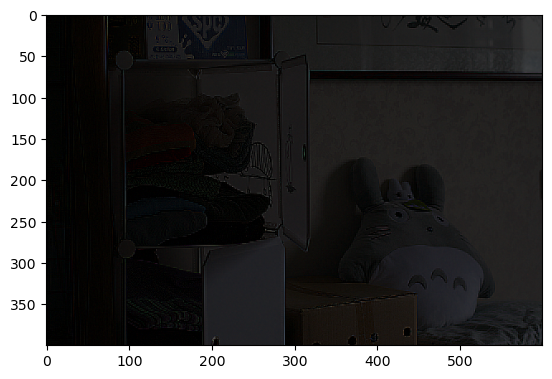

In [14]:
plt.imshow(gt_x[0].permute(1,2,0).numpy())

In [12]:
from skimage import io, metrics, exposure
psnr = metrics.peak_signal_noise_ratio(torch.sin(gt_x[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy())
ssim = metrics.structural_similarity(torch.sin(gt_x[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy(), multichannel=True)
print("gt_x:", [psnr, ssim])

gt_x: [12.133290511403205, 0.22477984]


/tmp/ipykernel_591803/1904948207.py:3: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  ssim = metrics.structural_similarity(torch.sin(gt_x[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy(), multichannel=True)


In [13]:
from skimage import io, metrics, exposure
psnr = metrics.peak_signal_noise_ratio(torch.sin(x_gt[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy())
ssim = metrics.structural_similarity(torch.sin(x_gt[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy(), multichannel=True)
print("J=4:", [psnr, ssim])

J=4: [30.993990213433506, 0.94982195]


/tmp/ipykernel_591803/50253428.py:3: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  ssim = metrics.structural_similarity(torch.sin(x_gt[0]).permute(1,2,0,).numpy(), gt.permute(1,2,0).numpy(), multichannel=True)


# LBP

In [25]:
def LBP(src):
    '''
    :param src:灰度图像
    :return:
    '''
    height = src.shape[0]
    width = src.shape[1]
    dst = src.copy()
    lbp_value = np.zeros((1,8), dtype=np.uint8)
    
    neighbours = np.zeros((1,8), dtype=np.uint8)
    
    for x in range(1, width-1):
        for y in range(1, height-1):
            neighbours[0, 0] = src[y - 1, x - 1]
            neighbours[0, 1] = src[y - 1, x]
            neighbours[0, 2] = src[y - 1, x + 1]
            neighbours[0, 3] = src[y, x - 1]
            neighbours[0, 4] = src[y, x + 1]
            neighbours[0, 5] = src[y + 1, x - 1]
            neighbours[0, 6] = src[y + 1, x]
            neighbours[0, 7] = src[y + 1, x + 1]
            center = src[y, x]
            for i in range(8):
                if neighbours[0, i] > center:
                    lbp_value[0, i] = 1
                else:
                    lbp_value[0, i] = 0

            lbp = lbp_value[0, 0] * 1 + lbp_value[0, 1] * 2 + lbp_value[0, 2] * 4 + lbp_value[0, 3] * 8 \
                + lbp_value[0, 4] * 16 + lbp_value[0, 5] * 32 + lbp_value[0, 6] * 64 + lbp_value[0, 7] * 128
            
            #print(lbp)
            dst[y, x] = lbp

    return dst


# FFT

In [309]:
import torch.nn.functional as F
_, H, W = gt.shape
x_fft = torch.fft.fft2(x , dim = 2,  norm = 'backward')
x_mag = torch.abs(x_fft)
x_pha = torch.angle(x_fft)
x_r = x_mag * torch.cos(x_pha)
x_i = x_mag * torch.sin(x_pha)

x_r_fft = torch.fft.fft2(x_r, dim = 2, norm = 'backward')
x_r_mag = torch.abs(x_r_fft)
x_r_pha = torch.angle(x_r_fft)
x_r_r = x_r_mag * torch.cos(x_r_pha)
x_r_i = x_r_mag * torch.sin(x_r_pha)

gt_fft = torch.fft.fft2(x*3 ,dim = 2,  norm = 'backward')
gt_mag = torch.abs(gt_fft)
gt_pha = torch.angle(gt_fft)
gt_r = gt_mag * torch.cos(gt_pha)
gt_i = gt_mag * torch.sin(gt_pha)

gt_r_fft = torch.fft.fft2(gt_r,dim = 2, norm = 'backward')
gt_r_mag = torch.abs(gt_r_fft)
gt_r_pha = torch.angle(gt_r_fft)
gt_r_r = gt_r_mag * torch.cos(gt_r_pha)
gt_r_i = gt_r_mag * torch.sin(gt_r_pha)

e = torch.randn_like(x_r_r)
pred_r = torch.fft.ifft2(torch.complex(gt_r_r, x_r_i), dim = 2, norm = 'backward').real

pred_x = torch.fft.ifft2(torch.complex(pred_r, x_i), dim = 2, norm = 'backward').real



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


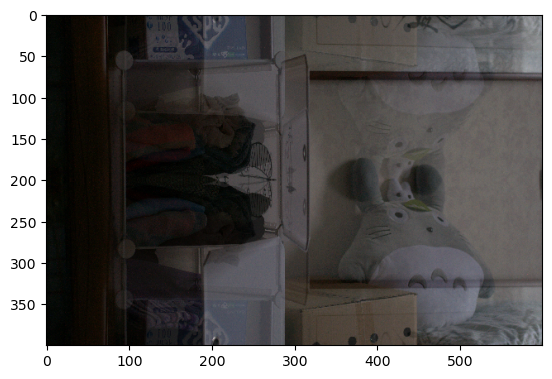

In [310]:
v2 = transforms.Compose([
            transforms.RandomHorizontalFlip(p=1.),
        ])
plt.imshow((pred_x[0]).permute(1,2,0).numpy())

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


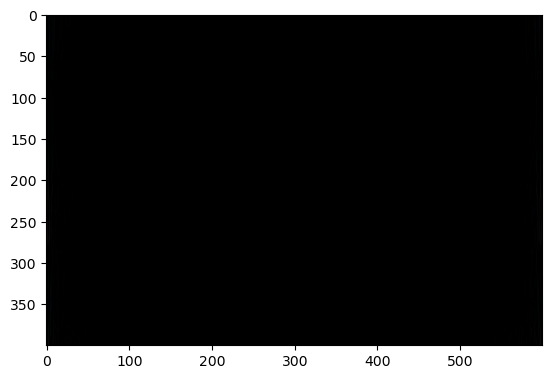

In [277]:
mix = torch.fft.ifft2(torch.complex(gt_r, x_i), dim = -1, norm = 'backward').real

plt.imshow(torch.sin(mix[0]).permute(1,2,0).numpy())

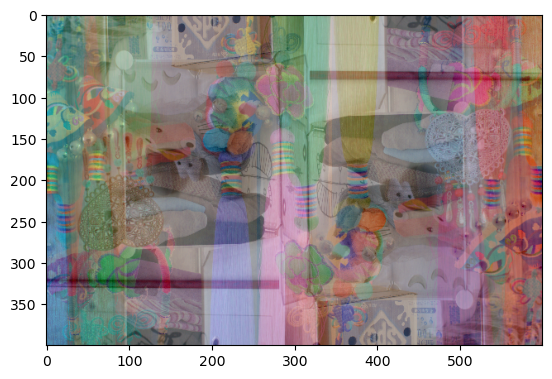

In [283]:
# x_fft = torch.fft.fft2(x , dim = 3,  norm = 'backward')
x_fft = torch.fft.fft(torch.fft.fft(img2.unsqueeze(0), dim=2), dim=3)
# gt_fft = torch.fft.fft2(gt.unsqueeze(0) ,dim = 3,  norm = 'backward')
gt_fft = torch.fft.fft(torch.fft.fft(gt.unsqueeze(0), dim=2), dim=3)
# mix = torch.fft.ifft(
#     torch.fft.ifft(torch.complex(gt_fft.real, x_fft.imag), dim=2), dim=2)

mix = torch.fft.ifft2(torch.complex(gt_fft.real, x_fft.imag), dim=(3,2))
mix = torch.sin(torch.abs(mix))
plt.imshow((mix[0]).permute(1,2,0).numpy())

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


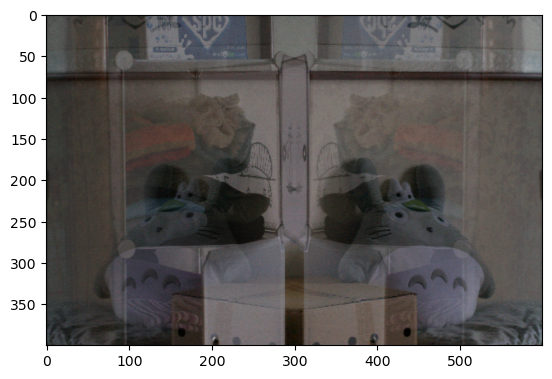

In [377]:
x_fft = torch.fft.fft2(x, dim=-1)
x_mag = torch.abs(x_fft)
x_pha = torch.angle(x_fft)

x_wt, _ = dwt(upsample(upsample(x)))
x_wt = torch.fft.fft2(x_wt, dim=-1)
wt_mag = torch.abs(x_wt)
wt_pha = torch.angle(x_wt)

gt_fft = torch.fft.fft2(gt.unsqueeze(0), dim=-1)
gt_mag = torch.abs(gt_fft)
gt_pha = torch.angle(gt_fft)

mix_r = wt_mag * torch.cos(x_pha)
mix_i = x_mag * torch.sin(wt_pha)

mix = torch.fft.ifft2(torch.complex(mix_r, mix_i), dim=-1).real
plt.imshow(mix[0].permute(1,2,0).numpy())

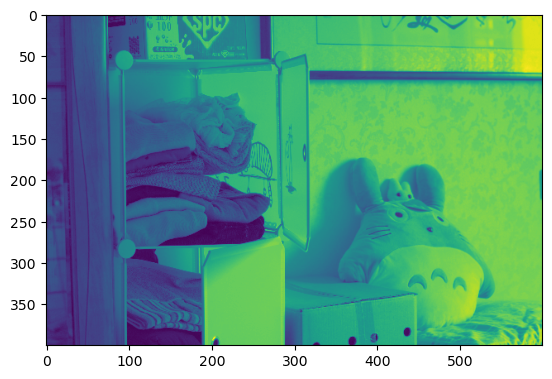

In [381]:
dark = gt.unsqueeze(0)
dark = dark[:, 0:1, :, :] * 0.299 + dark[:, 1:2, :, :] * 0.587 + dark[:, 2:3, :, :] * 0.114
plt.imshow(dark[0].permute(1,2,0).numpy())

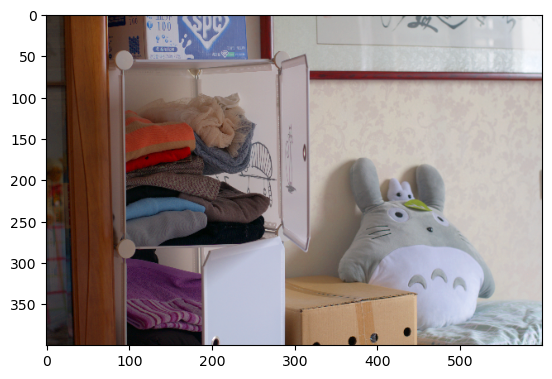

In [380]:
plt.imshow(gt.permute(1,2,0).numpy())

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


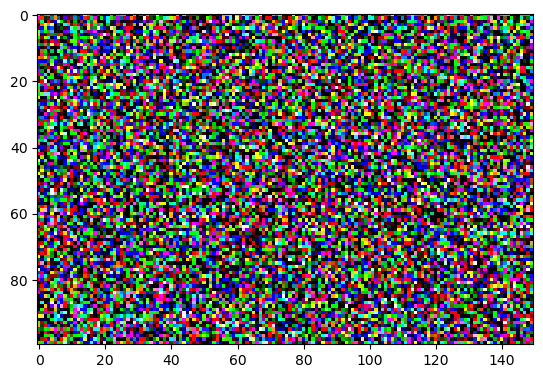

In [17]:
x_L, _, _, _ = dwt_init(x)
x_LL, _, _, _ = dwt_init(x_L)
e = torch.randn_like(x_LL)
plt.imshow(e[0].permute(1,2,0).numpy())

# Learnable filter
使用类似EFFNet中或者IRnext/SFnet 中的方式，实现动态的filter，而不是固定的方式

In [5]:
class DF(nn.Module):
    '''Frequency-Hierarchy module'''

    def __init__(self, channel_num):
        super(DF, self).__init__()

        self.C0 = nn.Sequential(
             nn.Conv2d(channel_num, channel_num//3, groups=channel_num//3, kernel_size=3, stride=1, padding=1),
             nn.LeakyReLU(inplace=True))
             
        self.C1 = nn.Sequential(
             nn.Conv2d(channel_num, channel_num//3, groups=channel_num//3, kernel_size=3, stride=1, padding=2, dilation = 2),
             nn.LeakyReLU(inplace=True))    

        self.C2 = nn.Sequential(
             nn.Conv2d(channel_num, channel_num//3, groups=channel_num//3, kernel_size=3, stride=1, padding=3, dilation = 3),
             nn.LeakyReLU(inplace=True))

        self.R = nn.GELU()

    def forward(self, x):
        l = self.R(self.C2(x))
        m = self.R(self.C1(x) - l)
        h = self.R(self.C0(x) - self.C1(x))
        return l, m, h   

In [6]:
df = DF(3)
l, m, h = df(x)

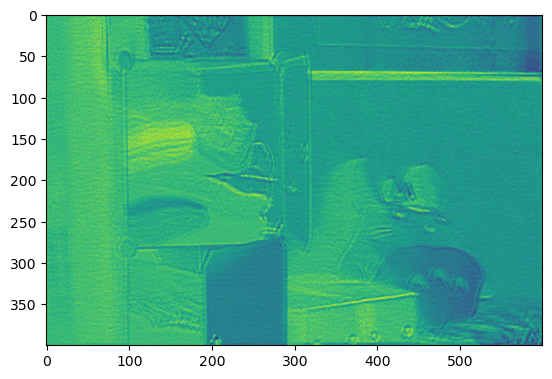

In [10]:
plt.imshow(l[0].permute(1,2,0).detach().numpy())

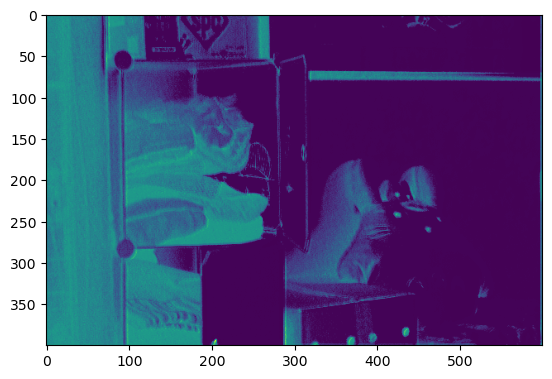

In [11]:
plt.imshow(m[0].permute(1,2,0).detach().numpy())

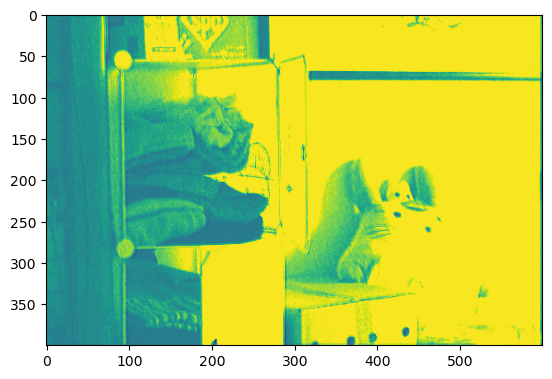

In [12]:
plt.imshow(h[0].permute(1,2,0).detach().numpy())

In [24]:
low_filter = nn.AdaptiveAvgPool2d((1, 1))
conv = nn.Conv2d(3, 8*3**2, kernel_size=1, stride=1, bias=False)
img_low = conv(low_filter(x))

In [26]:
n, c1, p, q = img_low.shape

In [27]:
img_low = img_low.reshape(n, c1//3**2, 3**2, p*q).unsqueeze(2)
img_low.shape


torch.Size([1, 8, 1, 9, 1])

In [29]:
act = nn.Tanh()
img_low = act(img_low)
n, c, h, w = x.shape
low_part = torch.sum(x * img_low, dim=3).reshape(n, c, h, w)

RuntimeError: The size of tensor a (400) must match the size of tensor b (9) at non-singleton dimension 3

RuntimeError: shape '[1, 3, 400, 600]' is invalid for input of size 1200